# Simple SSD on PennFudan

**Goal:** Implement and train simple network for detecting people on an image.
****
**Author:** Paweł Subko. Please send questions regarding this task to: P.Subko@mimuw.edu.pl .
****
**Deliverables:**

1. Jupyter notebook with the best result. Please keep all the logs in the jupyter notebook.

2. Short report describing how you solved key problems of the assignment (balancing classes, choosing anchors, parameters you trained with).

3. The best model in terms of metrics in *.ckpt format.
****



## Overview

In this task, **FOR THE TOTAL OF 10 points** one should (for details read text in the notebook):
- determine the size of the feasible anchors for the object detection task posed in this Assignment,
- build an object detection model using the variant of `SSD` with EfficientNet backbone,
- fill in gaps in implementation,
- train model and achive at least 55% mean average precision on test dataloader

Hints and comments:

- model architecture and loss are heavily, yet loosely inspired by [SSD](https://arxiv.org/abs/1512.02325) paper and by [Pytorch Implementation](https://github.com/NVIDIA/DeepLearningExamples/tree/master/PyTorch/Detection/SSD)

- be sure that you understand the concept of an anchor for object detection, covered during the lecture about Object Detection. There are many great tutorials and articles about it (e.g. [this](https://towardsdatascience.com/anchor-boxes-the-key-to-quality-object-detection-ddf9d612d4f9) one).

## Data description
Similar to [pytorch object detection finetuning tutorial](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html) we use PennFudan dataset. It has only one clas and for simplicity our implementation takes adventage of it. This dataset also contains other descriptors we ignore.

* Note1: Tip: to debug write tests or fast dev run/overfit, not the full training!
* Note2: `(H, W)` may correspond to height and width of original image or to spatial dimensions of tensor obtained by processing image, but possibly downsampled. Usually, it's clear from the context.
* Note3: Regarding sending tensors `.to(device=DEVICE)` <- you must apply it to every tensor you explicitly create outside of LightningModule. Other tensors are handled by pytorch_lightning.
* Note4: "Test" and "Valid" are used interchangeably.

# Prerequisites:

In [1]:
!wget https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip

--2022-05-06 20:19:11--  https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
Resolving www.cis.upenn.edu (www.cis.upenn.edu)... 158.130.69.163, 2607:f470:8:64:5ea5::d
Connecting to www.cis.upenn.edu (www.cis.upenn.edu)|158.130.69.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53723336 (51M) [application/zip]
Saving to: ‘PennFudanPed.zip’

PennFudanPed.zip    100%[===================>]  51.23M  13.4MB/s    in 4.9s    

2022-05-06 20:19:17 (10.5 MB/s) - ‘PennFudanPed.zip’ saved [53723336/53723336]



In [2]:
!unzip PennFudanPed.zip

Archive:  PennFudanPed.zip
   creating: PennFudanPed/
  inflating: PennFudanPed/added-object-list.txt  
   creating: PennFudanPed/Annotation/
  inflating: PennFudanPed/Annotation/FudanPed00001.txt  
  inflating: PennFudanPed/Annotation/FudanPed00002.txt  
  inflating: PennFudanPed/Annotation/FudanPed00003.txt  
  inflating: PennFudanPed/Annotation/FudanPed00004.txt  
  inflating: PennFudanPed/Annotation/FudanPed00005.txt  
  inflating: PennFudanPed/Annotation/FudanPed00006.txt  
  inflating: PennFudanPed/Annotation/FudanPed00007.txt  
  inflating: PennFudanPed/Annotation/FudanPed00008.txt  
  inflating: PennFudanPed/Annotation/FudanPed00009.txt  
  inflating: PennFudanPed/Annotation/FudanPed00010.txt  
  inflating: PennFudanPed/Annotation/FudanPed00011.txt  
  inflating: PennFudanPed/Annotation/FudanPed00012.txt  
  inflating: PennFudanPed/Annotation/FudanPed00013.txt  
  inflating: PennFudanPed/Annotation/FudanPed00014.txt  
  inflating: PennFudanPed/Annotation/FudanPed00015.txt  
  i

In [3]:
!pip install torchmetrics pytorch_lightning

     |████████████████████████████████| 409 kB 655 kB/s 
     |████████████████████████████████| 584 kB 11.9 MB/s 
     |████████████████████████████████| 596 kB 36.7 MB/s 
     |████████████████████████████████| 136 kB 42.5 MB/s 
     |████████████████████████████████| 1.1 MB 49.3 MB/s 
     |████████████████████████████████| 271 kB 42.4 MB/s 
     |████████████████████████████████| 94 kB 3.1 MB/s 
     |████████████████████████████████| 144 kB 45.4 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


Let's start with useful imports:

In [4]:
import os

from functools import reduce
from typing import Optional, Dict, Tuple, List, Union

import torch
import torchvision
import random

import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from torchvision.ops import box_convert
from torchvision.transforms import functional as F
from torchvision.utils import draw_bounding_boxes

from torch import nn, Tensor
from torchvision.transforms import functional as F
from torchvision.transforms import transforms as T, InterpolationMode
import itertools


torch.manual_seed(0)
random.seed(0)
np.random.seed(0)

Very useful for debug:

In [5]:
from utils import debug

# PARAMS
Let's define important parameters we'll use later (detect anomaly and fast_dev_run may come in handy later):



In [6]:
ACCELEREATOR = "gpu" # 'cpu' or 'gpu'  # MODIFY ME
DATASET_PATH = "./PennFudanPed"
INPUT_SIZE = 160  # DO NOT CHANGE

CLS_THRESHOLD = 0.5  # DO NOT CHANGE
IOU_THRESHOLD = 0.5  # DO NOT CHANGE
ANCHOR_SHAPES = [(5, 2)] # MODIFY ME <- FILL IN WITH PROPER VALUES proposed anchors: (5, 2), (8, 3), (12, 5)
REDUCTION_IDS = [4] # possibly [3,4]

# by modifying anchor shapes and reduction ids we can controll where in the network (reduction ids) we attach what anchors (anchor shapes)


EPOCHS = 400  # MODIFY ME

LEARNING_RATE = 0.001  # MODIFY ME 0.001
LR_DECAY = 0.997  # MODIFY ME 0.997

BATCH_SIZE_TRAIN = 16  # MODIFY ME
BATCH_SIZE_VALID = 8

COEFF_CLS = 2 * 1 / 10  # MODIFY ME
COEFF_REG = 2 * 9 / 10  # MODIFY ME

DETECT_ANOMALY = False
FAST_DEV_RUN = False

VAL_IMGS_TO_SEND = 2
VALID_SIZE = 10  # DO NOT CHANGE, valid results and your assignment score depend on it!
MULTIPLY_VALID_N_TIMES = 10  # DO NOT CHANGE, valid results and your assignment score depend on it!

NMS_THRESHOLD = 0.45  # DO NOT CHANGE, valid results and your assignment score depend on it!

DEVICE = 'cuda' if ACCELEREATOR=="gpu" else 'cpu'

# Transformations
The dataset is very small and we'll havily use the following augmentations (from pytorch object detection). You don't have to read this code super carefully.

In [7]:
import transforms as T


# Implement custom transformations (1 p.)
* Implement resizing of image and boxes. Resize should resize an image such that the shorter side of an image after resize is of the `shorter` size and aspect ratio is kept. Don't forget to resize boxes. `normalize_boxes` and `denormalize_boxes` - read comments. See class `Normalize`.



In [8]:
class Normalize(torch.nn.Module):
    def __init__(self):
        super(Normalize, self).__init__()

    def forward(self, image: Tensor,
                target: Optional[Dict[str, Tensor]] = None) -> Tuple[Tensor, Optional[Dict[str, Tensor]]]:
        W, H = F.get_image_size(image)
        target['boxes'] = normalize_boxes(target['boxes'], H, W)
        return normalize_image(image), target


class Resize(torch.nn.Module):
    def __init__(self, shorter):
        super(Resize, self).__init__()
        self.shorter = shorter

    def forward(self, image: Tensor,
                target: Optional[Dict[str, Tensor]] = None) -> Tuple[Tensor, Optional[Dict[str, Tensor]]]:
        (_, h, w) = image.shape
        new_h, new_w = h, w
        ratio = h / w
        if ratio > 1:
            new_w = self.shorter
            new_h = int(new_w * ratio)
        else:
            new_h = self.shorter
            new_w = int(new_h / ratio)

        image = F.resize(image, [new_h, new_w])

        target['boxes'] = denormalize_boxes(
            normalize_boxes(target['boxes'], h, w),
            new_h, new_w
        )

        return image, target

def normalize_image(img):
  return (img - 0.5)/0.5


def denormalize(img):
    return ((img + 1) / 2) * 255 # div255 is perofmed by ToTensor


def normalize_boxes(boxes, H, W):
    """
    :param boxes: format [N, 4], xyxy
    :param H: image height int
    :param W: image width int
    :return: normalized boxes in format [N, 4], xyxy , xy in [0, 1]x[0, 1]
    """
    boxes_norm = boxes / torch.tensor([W, H, W, H]).to(device=boxes.device)

    return boxes_norm


def denormalize_boxes(boxes, H, W):
    """
    :param boxes: normalized boxes in format [N, 4], xyxy , xy in [0, 1]x[0, 1]
    :param H: image height int
    :param W: image width int
    :return: normalized boxes in format [N, 4], xyxy, xy in [0, W]x[0, H]
    """
    boxes_denorm = boxes * torch.tensor([W, H, W, H]).to(device=boxes.device)
    
    return boxes_denorm

# Dataset

In [9]:
class PennFudanDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        # load images and masks
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = Image.open(mask_path)
        # convert the PIL Image into a numpy array
        mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        target = {'boxes': boxes}

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        boxes = target['boxes']

        return img, boxes

    def __len__(self):
        return len(self.imgs)


In [10]:
def get_transform(train: bool, input_size: int):
    trans = [
        T.PILToTensor(),
        T.ConvertImageDtype(torch.float32),
        Resize(shorter=128)
    ]
    RIC = T.RandomIoUCrop(min_scale=0.8, max_scale=1.1, min_aspect_ratio=0.7, max_aspect_ratio=1.3)
    if train:
        trans += [T.RandomPhotometricDistort()]
    trans += [T.RandomHorizontalFlip(), RIC, T.RandomZoomOut(side_range=(1.0, 1.7), p=1.0)
              ]
    H, W = (input_size, input_size)
    trans += [T.FixedSizeCrop((H, W)), Normalize()]

    transform = T.Compose(trans)
    return transform

def collate_fn(batch):
    return tuple(zip(*batch))


def get_dataloader(data_path, train: bool, batch_size, input_size):
    dataset = PennFudanDataset(data_path, get_transform(train, input_size))

    indices = list(range(len(dataset)))
    if train:
        indices = indices[:-VALID_SIZE]
    else:
        indices = indices[-VALID_SIZE:]


    dataset = torch.utils.data.Subset(dataset, indices)

    if not train:
        dataset = torch.utils.data.ConcatDataset([dataset]*MULTIPLY_VALID_N_TIMES)
    
    print("Dataset size:", len(dataset))

    dataloader = torch.utils.data.DataLoader(dataset, batch_size, shuffle=train, num_workers=0, collate_fn=collate_fn, pin_memory=True)

    return dataloader


def show_sample(dataloader, num_samples=1):
    for _ in range(num_samples):
        img, target = next(iter(dataloader))
        res_imgs = []
        for i in range(min([len(img), 8])):
            boxes = target[i]
            im = img[i]
            im = denormalize(im).byte()
            bb = denormalize_boxes(boxes, im.shape[1], im.shape[2])
            im2 = draw_bounding_boxes(im, bb, colors=(255, 0, 0))
            res_imgs.append(im2)
        res_imgs = torch.stack(res_imgs, dim=0)
        res_grid = torchvision.utils.make_grid(res_imgs)
        res_grid = res_grid.permute([1, 2, 0])
        plt.imshow(res_grid/255)
        plt.show()

def show_ratios(dataloader, samples=10, anchors=[]):
    ws = []
    hs = []
    for _ in range(samples):
        img, target = next(iter(dataloader))
        for i in range(len(img)):
            boxes = target[i]
            im = img[i]
            im = denormalize(im).byte()
            bb = denormalize_boxes(boxes, im.shape[1], im.shape[2])
            im2 = draw_bounding_boxes(im, bb, colors=(255, 0, 0))
            for b in bb:
              x1, y1, x2, y2 = b
              ws.append(x2 - x1)
              hs.append(y2 - y1)
    plt.hist2d(ws, hs, bins=20)
    anchor_points = [
      (scale * ay, scale * ax)
      for (ay, ax), scale in itertools.product(anchors, [8, 16])
    ]
    ays = [y for y, _ in anchor_points]
    axs = [x for _, x in anchor_points]
    plt.scatter(axs, ays, color="red")
    plt.show()


Dataset size: 160
Train:


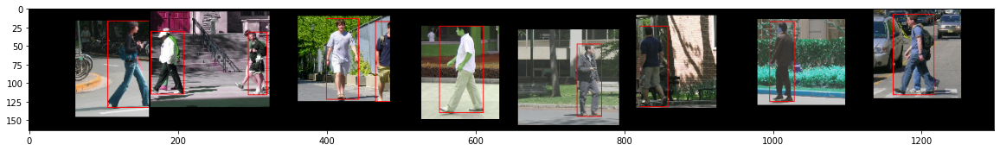

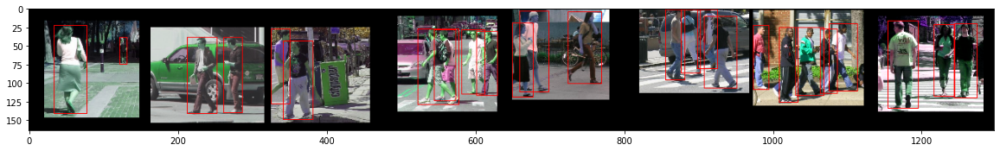

Dataset size: 100
Test:


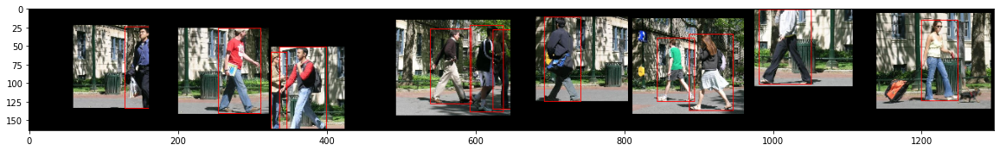

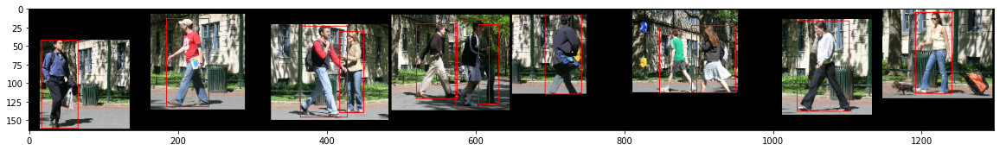

In [11]:
plt.rcParams['figure.figsize'] = [20, 20]

dataloader_train = get_dataloader(DATASET_PATH,
                                  train=True,
                                  batch_size=BATCH_SIZE_TRAIN,
                                  input_size=INPUT_SIZE
                                  )
print("Train:")
show_sample(dataloader_train, num_samples=2)


dataloader_test = get_dataloader(DATASET_PATH,
                                 train=False,
                                 batch_size=BATCH_SIZE_VALID,
                                 input_size=INPUT_SIZE
                                 )
print("Test:")
show_sample(dataloader_test, num_samples=2)


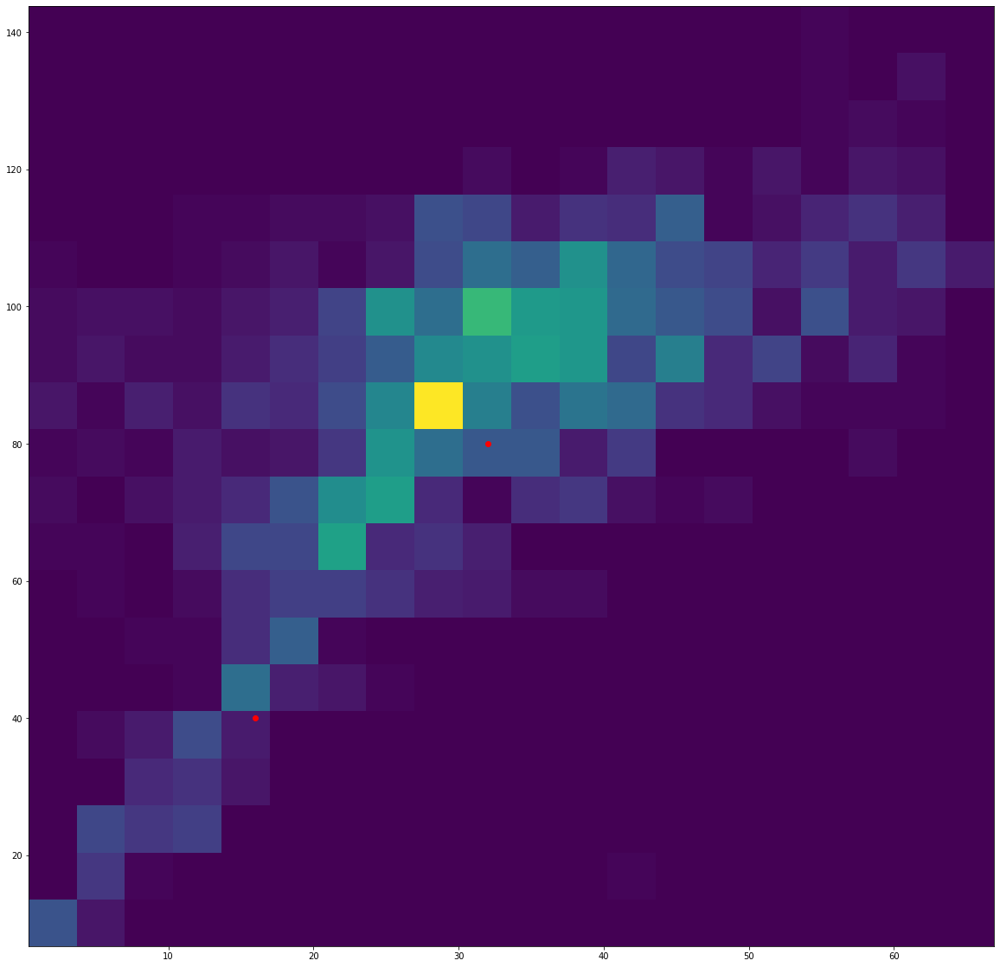

In [12]:
show_ratios(dataloader_train, samples=50, anchors=ANCHOR_SHAPES)

Important note: Our test data is very small. To extend our validation we also augment test dataset. We assume that our test data comes from such distribution. To avoid bad seed/randomization problems we multiply it many times (`MULTIPLY_TEST_N_TIMES` times).

# Implement Neural Network (1 p.)
For bakcbone use EfficientNet B2 pretrained on ImageNet.
* Implement missing methods.


In [13]:
!pip3 install efficientnet_pytorch

  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=20221d8c0b008fbde594e10712ea8e9e6857029b3d117dd536ab4a04eebd068e
  Stored in directory: /root/.cache/pip/wheels/0e/cc/b2/49e74588263573ff778da58cc99b9c6349b496636a7e165be6
Successfully built efficientnet-pytorch


In [14]:
import torch.nn as nn

# from torchvision.models import efficientnet_b2

from efficientnet_pytorch import EfficientNet

EFFICIENT_NET_MODEL_NAME = 'efficientnet-b2'
en_input_channels = [3, 16, 24, 48, 120, 352, 1408]
en_shorter_sizes = [160, 80, 40, 20, 10,  5, 5]
# reduction_ids = [3, 4] # [3, 4]


class Head(nn.Module):
    def __init__(self, channels_in, anchor_shape):
        super(Head, self).__init__()
        self.anchor_shape = anchor_shape
        self.conv1 = nn.Conv2d(channels_in, 4 + 1, kernel_size=3, padding=1)

    def forward(self, x):
        x = self.conv1(x)
        cls, reg = x[:,:1], x[:,1:]
        # cls = torch.sigmoid(cls)
        return cls, reg


class EfficientSSD(nn.Module):
    def __init__(self, anchor_shapes):
        super(EfficientSSD, self).__init__()
        self.anchor_shapes = anchor_shapes
        self.feature_extractor = EfficientNet.from_pretrained(EFFICIENT_NET_MODEL_NAME).to(device=DEVICE)

        self.reduction_ids = REDUCTION_IDS
        self.input_channels = [en_input_channels[rid] for rid in self.reduction_ids]
        self.shorter_sizes = [en_shorter_sizes[rid] for rid in self.reduction_ids]
        self.heads = nn.ModuleList([Head(in_channels, shape).to(device=DEVICE) for shape, in_channels in itertools.product(self.anchor_shapes, self.input_channels)])

    def forward(self, x):
        intermediate_outputs_dict = self.feature_extractor.extract_endpoints(x)
        intermediate_outputs = [intermediate_outputs_dict[f"reduction_{red_id}"] for red_id in self.reduction_ids]

        head_outputs = [head(inter_out) for head, inter_out in zip(self.heads, intermediate_outputs * len(self.anchor_shapes))]
        return head_outputs

In [15]:
# [16, 24, 48, 120, 352, 1408]
# [64, 32, 16, 8,  4,   4]
# 1.   2.  3.  4.   5.   6

In [16]:
tensor = torch.ones(size=(16, 3, 160, 256)).to(device=DEVICE)


def test_efficientnet_ssd():
    net = EfficientSSD(anchor_shapes=ANCHOR_SHAPES)
    res = net(tensor)
    print(len(res), ", ", res[0][0].shape, ", ", res[0][1].shape)

test_efficientnet_ssd()

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b2-8bb594d6.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b2-8bb594d6.pth


  0%|          | 0.00/35.1M [00:00<?, ?B/s]

Loaded pretrained weights for efficientnet-b2
1 ,  torch.Size([16, 1, 10, 16]) ,  torch.Size([16, 4, 10, 16])


# Implement generating proposals. (1 p.)
Note that at this point coordinates of boxes are in [0, 1]. Proposals size on the image should be computed using [formula for receptive field](https://www.baeldung.com/cs/cnn-receptive-field-size) or some approximation.
* Implement missing functions.

In [17]:
def calculate_receptive_field(size, reduction_id):
  def rf_scale(r, k, s):
    return r * s + (k - s)
  conv_ks = ks = [(3, 2), (3, 1), (3, 1), (3, 2), (3, 1), (3, 1), (5, 2), (5, 1), (5, 1), (3, 2), (3, 1), (3, 1), (3, 1), (5, 1), (5, 1), (5, 1), (5, 1), (5, 2), (5, 1), (5, 1), (5, 1), (5, 1), (3, 1), (3, 1)]
  checkpoints = [0, 3, 6, 9, 17, 24, 24]
  r = size
  for k, s in list(reversed(ks[:checkpoints[reduction_id]])):
    r = rf_scale(r, k, s)
  return r

precalculated_shapes = {
    ((ax, ay), rid): (calculate_receptive_field(ax, rid), calculate_receptive_field(ay, rid))
    for (ax, ay), rid in itertools.product(ANCHOR_SHAPES, REDUCTION_IDS)
}
print(precalculated_shapes)

{((5, 2), 4): (543, 495)}


In [18]:
def generate_indexes(shape):
    # shape in (H, W) format
    H,W = shape
    x = torch.linspace(1/(2*W), 1 - 1/(2*W), W)
    y = torch.linspace(1/(2*H), 1 - 1/(2*H), H)
    ys, xs = torch.meshgrid(y, x)
    return xs, ys

def generate_proposals(anchor_shape, output_spatial_shape):
    """
    :param anchor_shape: (H, W)
    :param output_spatial_shape: (H, W)
    :return: tensor [4, H, W], coords format cxcywh all in [0, 1]
    """
    xs, ys = generate_indexes(output_spatial_shape)
    hs, ws = proposal_shape(anchor_shape, output_spatial_shape)
    res = torch.stack([xs, ys, ws, hs], dim=0)

    return res.to(device=DEVICE)


def proposal_shape(anchor_shape, output_spatial_shape):
    # rf_h, rf_w = precalculated_shapes[(anchor_shape, reduction_id)]
    a_h, a_w = anchor_shape
    o_h, o_w = output_spatial_shape
    shorter = min(o_h, o_w)
    h = a_h / shorter
    w = a_w / shorter
    hs = torch.ones(output_spatial_shape) * h
    ws = torch.ones(output_spatial_shape) * w
    return hs, ws



Lets define useful function when operating on boxes:

In [19]:
from utils import flatten_boxes_tensor

# Analyse proposals (1 p.)
* Modify previously defined ANCHOR_SIZES balancing training time and coverage of ground truth boxes. Report results.

In [20]:
# we assume our neural network makes some downsamples
DEBUG=True
num_downsamples = 4

rescale = 2**num_downsamples

boxes = []
for dp in dataloader_train:
    imgs, targets = dp
    for i in range(BATCH_SIZE_TRAIN):
        for gt_boxes in targets[i]:
            boxes.append(gt_boxes)

boxes = torch.stack(boxes).to(device=DEVICE)

dp = next(iter(dataloader_train))
imgs, targets = dp
img = imgs[0]
H_out, W_out = img.shape[1] // rescale, img.shape[2] // rescale


masks = []
for AS in ANCHOR_SHAPES:
    proposals = generate_proposals(AS, (H_out, W_out))
    proposals = flatten_boxes_tensor(proposals)
    proposals = box_convert(proposals, "cxcywh", "xyxy")

    print(f"Generating proposals: anchor shape {AS}, spatial_shape: {(H_out, W_out)} \n")

    iou_matrix = torchvision.ops.box_iou(boxes, proposals)
    debug(iou_matrix, "iou_matrix")
    iou_max, idxes = iou_matrix.max(dim=1)
    mask = iou_max > IOU_THRESHOLD
    masks.append(mask)

mask_final = reduce(torch.logical_or, masks)
print(f"In total, there is {mask_final.sum()}/{len(boxes)} gt boxes covered, that is {mask_final.sum()/len(boxes)*100:.2f} % \n")
for i, (AS, m) in enumerate(zip(ANCHOR_SHAPES, masks)):
    print(f"Anchor {AS} covers {m.sum()}/{len(boxes)}, gt boxes, that is {m.sum()/len(boxes)*100:.2f} %")
    val = reduce(torch.logical_or, masks[:i] + masks[i+1:]).sum()
    added = mask_final.sum() - val
    print(f"Adding anchor {AS} covers additional: {added}/{len(boxes)} gt boxes, that is {added / len(boxes) * 100:.2f} % \n")
    print()

# this cell might cause errors when called on only one anchor shape. (just skip it)

/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Generating proposals: anchor shape (5, 2), spatial_shape: (10, 10) 

In total, there is 276/384 gt boxes covered, that is 71.88 % 

Anchor (5, 2) covers 276/384, gt boxes, that is 71.88 %


TypeError: ignored

This is copied from pytroch implementation! Before we implement loss function we define encoding and decoding functions. This encoding simplifies targets of the network to realtive offsets from corresponding proposals. In our case `encode_boxes` will be called for gt_boxes and corresponding proposals and `decode_single` will be called for output of regression and corresponding proposals. `decode_single` is modified to take `weights` as param.


In [21]:
from encode import encode_boxes, decode_single

# Implement loss function (1 p.)
This a simple (haha), iterative version of loss function. Iterates over batch and over gt_box on the image and is supposed to compute smooth l1 between gt boxes and predicted encoded boxes coordinates and cross entropy between class predictions and targets.
* Add loss functions and implement some form of balancing/sampling between positive examples and negative examples (sampling, hard negative mining, weighting loss etc.)

In [22]:
from torch.nn.functional import smooth_l1_loss, binary_cross_entropy_with_logits


def compute_loss(outputs, gt_boxes, anchor_shape, reg_weights):
    """
    :param outputs: Tuple: (cls logits tensor [N, 1, H, W] - only single class, regression output as encoded boxes tensor [N, 4, H, W]), where N is batch_size
    :param gt_boxes: format [N, 4], xyxy, xy in [0,1] x [0,1]
    :param anchor_shape: (H, W)
    :return: classification and regression losses
    """

    output_cls, output_reg = outputs

    loss_reg_init = torch.tensor(0.0, requires_grad = True).to(device=DEVICE)
    loss_cls_init = torch.tensor(0.0, requires_grad = True).to(device=DEVICE)

    loss_reg = [loss_reg_init]
    loss_cls = [loss_cls_init]

    H_out, W_out = output_reg.shape[2], output_reg.shape[3]

    # iteratively for each image in a batch
    for i in range(len(output_reg)): # assert len(output) == batch_size
        gt_boxes_per_img = gt_boxes[i]
        out_reg_per_img = output_reg[i]
        out_reg_per_img = flatten_boxes_tensor(out_reg_per_img)

        out_cls_per_img = output_cls[i]
        out_cls_per_img = torch.reshape(out_cls_per_img, [1, H_out*W_out]).permute([1, 0])

        proposals = generate_proposals(anchor_shape, (H_out, W_out))
        proposals = flatten_boxes_tensor(proposals)
        proposals = box_convert(proposals, "cxcywh", "xyxy")

        iou_matrix = torchvision.ops.box_iou(gt_boxes_per_img, proposals)

        if iou_matrix.numel() != 0:
            debug(iou_matrix, "iou_matrix")

        if iou_matrix.shape[0] > 0:

            # iteratively for each image in a batch # You can improve it, but not necessarily. # for each box on an image from the batch
            for j in range(len(gt_boxes_per_img)):
                gt_box = gt_boxes_per_img[j]
                matched_to_box = iou_matrix[j] > IOU_THRESHOLD
                matched_proposals = proposals[matched_to_box, :]

                encoded = encode_boxes(gt_box.expand(matched_proposals.shape), matched_proposals, weights=reg_weights)

                out_reg = out_reg_per_img[matched_to_box]

                if out_reg.shape[0] != 0:
                    loss_reg.append(smooth_l1_loss(out_reg, encoded))

            iou_max, idxes = iou_matrix.max(dim=0)

            matched_to_any = iou_max > IOU_THRESHOLD

            mismatched = (torch.squeeze(out_cls_per_img).float() - matched_to_any.float())

            mismatched[matched_to_any] = 0
            _, mismatched_idx = mismatched.sort(descending=True)
            _, mismatched_rank = mismatched_idx.sort()

            # i take most mismatched boxes. Those which are not matched, but the model thinks they are with the biggest confidence.

            hard_negative = mismatched_rank < 3 * matched_to_any.sum()

            mask_cls = torch.logical_or(matched_to_any, hard_negative)

            if matched_to_any.count_nonzero():

                out_cls_ = torch.squeeze(out_cls_per_img).float()[mask_cls]
                targets_cls_ = matched_to_any.float()[mask_cls]

                POS_WEIGHT = torch.tensor([3]).to(device=DEVICE)
                loss_cls_ = binary_cross_entropy_with_logits(out_cls_, targets_cls_, pos_weight=POS_WEIGHT)
                loss_cls.append(loss_cls_)

    loss_cls = torch.stack(loss_cls).sum()
    loss_reg = torch.stack(loss_reg).sum()
    return loss_cls, loss_reg


# Lightning model definition - implement predict_step (1 p.)
As metric we use Mean Average Precission, see [mAP](https://towardsdatascience.com/map-mean-average-precision-might-confuse-you-5956f1bfa9e2) and [mAP](https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173). In postprocess we remove small boxes and we remove overlapping boxes with lower scores (non maximum suppression).

In [23]:
import pytorch_lightning as pt
from torch.optim.lr_scheduler import ExponentialLR
from torchmetrics.detection import MeanAveragePrecision


class SimpleModel(pt.LightningModule):
    def __init__(self, net):
        super().__init__()
        self._net = net
        self._map = MeanAveragePrecision().cpu()
        self._reg_weights = torch.from_numpy(np.array([1, 1, 1, 1])).to(device=DEVICE)

    def forward(self, x):
        return self._net(x)

    def on_epoch_start(self):
        self.log("lr", self.lr_schedulers().get_last_lr()[0])

    def on_epoch_end(self):
        self.lr_schedulers().step()

    def training_step(self, batch, batch_idx):
        imgs, gt_boxes = batch

        imgs = torch.stack(imgs, dim=0)

        outputs = self(imgs)

        loss_cls = 0
        loss_reg = 0

        for out_id, (anchor_shape, _) in enumerate(itertools.product(self._net.anchor_shapes, self._net.reduction_ids)):
          loss_cls_, loss_reg_ = compute_loss(outputs[out_id], gt_boxes, anchor_shape, self._reg_weights)
          loss_cls += loss_cls_
          loss_reg += loss_reg_

        self.log("reg_loss", loss_reg)
        self.log("cls_loss", loss_cls)
        # I moved logs before scaling for better comparison between experiments
        l_reg = COEFF_REG * loss_reg
        l_cls = COEFF_CLS * loss_cls
        loss = l_cls + l_reg

        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.RMSprop(self.parameters(), lr=LEARNING_RATE)
        return [optimizer], [ExponentialLR(optimizer, gamma=LR_DECAY)]

    
    def on_validation_epoch_start(self):
      self._map.cpu()
      self._map.reset()


    def validation_step(self, batch, batch_idx):
        imgs, targets = batch

        imgs = torch.stack(imgs, dim=0)

        outputs = self(imgs)

        self._map.cpu()

        res_imgs = []
        for i in range(len(imgs)):
            im = imgs[i]
            out_cls = [] # outputs[0][0][i]
            out_reg = [] # outputs[0][1][i]
            proposals = []
            gt_boxes = targets[i]

            for out_id, (anchor_shape, _) in enumerate(itertools.product(self._net.anchor_shapes, self._net.reduction_ids)):
                out_cls_ = outputs[out_id][0][i]
                out_shape = (out_cls_.shape[1], out_cls_.shape[2])
                out_cls_ = out_cls_.reshape(1, -1)

                out_reg_ = outputs[out_id][1][i].reshape(4, -1)
                proposals_ = generate_proposals(anchor_shape, out_shape).reshape(4, -1)

                out_cls.append(out_cls_)
                out_reg.append(out_reg_)
                proposals.append(proposals_)
            
            out_cls = torch.cat(out_cls, 1)
            out_reg = torch.cat(out_reg, 1)
            proposals = torch.cat(proposals, 1)

            im = denormalize(im).byte()

            scores, boxes = self.postprocess(out_cls, out_reg, cls_threshold=CLS_THRESHOLD, proposals=proposals)

            idxes = torchvision.ops.nms(boxes, scores, iou_threshold=NMS_THRESHOLD)
            boxes = boxes[idxes]
            scores = scores[idxes]

            H, W = im.shape[1], im.shape[2]

            if boxes.shape[0] > 0:
                boxes = denormalize_boxes(boxes, H, W)
            gt_bb = denormalize_boxes(gt_boxes, H, W)

            if batch_idx < VAL_IMGS_TO_SEND:
              im = draw_bounding_boxes(im.cpu(), gt_bb.cpu(), colors=(255, 0, 0))
              im = draw_bounding_boxes(im, boxes.cpu(), colors=(0, 255, 0))
              res_imgs.append(im)

            labels = torch.ones(scores.shape, dtype=torch.int32)
            labels2 = torch.ones(gt_boxes.shape[0], dtype=torch.int32)

            preds = [{"boxes": boxes[:1].float().cpu(), "scores": scores[:1].cpu(), "labels": labels[:1].cpu()}]
            target = [{"boxes": gt_bb.float().cpu(), "labels": labels2.cpu()}]
      
            self._map.update(preds, target)
        if batch_idx < VAL_IMGS_TO_SEND:

          res_imgs = torch.stack(res_imgs, dim=0)

          res_grid = torchvision.utils.make_grid(res_imgs)
          self.logger.experiment.add_image(f'outputs{batch_idx}', res_grid, global_step=self.global_step)
        self.log('val_map', self._map.compute()['map'])

    
    def on_validatoin_epoch_end(self):
      self.log('val_map', self._map.compute()['map'])


    def predict_step(self, batch, batch_idx):
        imgs, _ = batch
        imgs = torch.stack(imgs, dim=0)
        outputs = self(imgs)

        self._map.cpu()

        res_imgs = []
        for i in range(len(imgs)):
            im = imgs[i]
            out_cls = []
            out_reg = []
            proposals = []

            for out_id, (anchor_shape, _) in enumerate(itertools.product(self._net.anchor_shapes, self._net.reduction_ids)):
                out_cls_ = outputs[out_id][0][i]
                out_shape = (out_cls_.shape[1], out_cls_.shape[2])
                out_cls_ = out_cls_.reshape(1, -1)

                out_reg_ = outputs[out_id][1][i].reshape(4, -1)
                proposals_ = generate_proposals(anchor_shape, out_shape).reshape(4, -1)

                out_cls.append(out_cls_)
                out_reg.append(out_reg_)
                proposals.append(proposals_)
            
            out_cls = torch.cat(out_cls, 1)
            out_reg = torch.cat(out_reg, 1)
            proposals = torch.cat(proposals, 1)
            
            im = denormalize(im).byte()

            scores, boxes = self.postprocess(out_cls, out_reg, cls_threshold=CLS_THRESHOLD, proposals=proposals)

            idxes = torchvision.ops.nms(boxes, scores, iou_threshold=NMS_THRESHOLD)
            boxes = boxes[idxes]
            scores = scores[idxes]

            H, W = im.shape[1], im.shape[2]

            if boxes.shape[0] > 0:
                boxes = denormalize_boxes(boxes, H, W)

            im = draw_bounding_boxes(im, boxes.cpu(), colors=(0, 255, 0))
            res_imgs.append(im)

            labels = torch.ones(scores.shape, dtype=torch.int32)
            preds = [{"boxes": boxes.cpu(), "scores": scores.cpu(), "labels": labels.cpu()}]
        
        res_imgs = torch.stack(res_imgs, dim=0)
        res_grid = torchvision.utils.make_grid(res_imgs)
        return imgs, preds, res_grid


    def postprocess(self, out_cls, out_reg, cls_threshold, proposals):
        """
        out_reg -> "cxcywh"
        """
        scores = torch.sigmoid(out_cls)
        mask = scores >= cls_threshold

        proposals_boxes_ = proposals.expand(out_reg.shape)

        proposals_boxes_ = proposals_boxes_[:, mask.squeeze()]

        proposals_boxes_ = flatten_boxes_tensor(proposals_boxes_)

        out_reg = out_reg[mask.expand(out_reg.shape)]
        out_reg = flatten_boxes_tensor(out_reg)

        out_reg = decode_single(out_reg, proposals_boxes_, weights=self._reg_weights)

        scores = scores[mask]

        out_reg = torchvision.ops.clip_boxes_to_image(out_reg, (1, 1))
        idxes = torchvision.ops.remove_small_boxes(out_reg, min_size=1 / 100)

        out_reg = out_reg[idxes]
        scores = scores[idxes]

        return scores, out_reg


# Training and validation (2 p.)
You should achive > 55 mAP. After 2k steps results should start looking reasonable. On gpu it should run ~1Epoch/10s, so after ~15 minutes you should see some reasonable detections.
* Modify training paramters, optimizer, etc. and use other ML techniques of your choice (regularization, test time augmentation etc.).

In [24]:
%load_ext tensorboard

In [25]:
log_dir = 'tb_logs'

In [37]:
# !kill 293

In [38]:
%tensorboard --logdir tb_logs

<IPython.core.display.Javascript object>

In [28]:
from pytorch_lightning.loggers import TensorBoardLogger

logger = TensorBoardLogger(log_dir, name="my_model")

net = EfficientSSD(anchor_shapes=ANCHOR_SHAPES).to(device=DEVICE)
model = SimpleModel(net)

trainer = pt.Trainer(max_epochs=EPOCHS,
                     detect_anomaly=DETECT_ANOMALY,
                     logger=logger,
                     check_val_every_n_epoch=EPOCHS//20,
                     accelerator=ACCELEREATOR,
                     fast_dev_run=FAST_DEV_RUN,
                     profiler='simple',
                     )

trainer.fit(model, dataloader_train, dataloader_test)
trainer.save_checkpoint("simple_ssd.ckpt")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:308: LightningDeprecationWarning: The `LightningModule.on_epoch_start` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_start` instead.
  f"The `LightningModule.{hook}` hook was deprecated in v1.6 and"
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:308: LightningDeprecationWarning: The `LightningModule.on_epoch_end` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_end` instead.
  f"The `LightningModule.{hook}` hook was deprecated in v1.6 and"
Missing logger folder: tb_logs/my_model
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Loaded pretrained weights for efficientnet-b2



  | Name | Type                 | Params
----------------------------------------------
0 | _net | EfficientSSD         | 9.1 M 
1 | _map | MeanAveragePrecision | 0     
----------------------------------------------
9.1 M     Trainable params
0         Non-trainable params
9.1 M     Total params
36.462    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/data.py:73: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  "Trying to infer the `batch_size` from an ambiguous collection. The batch size we"
/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1931: PossibleUserWarning: Th

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

FIT Profiler Report

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                                                                    	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                                       

In [29]:
!ls tb_logs

my_model


In [30]:
# !rm -r tb_logs

In [31]:
checkpoint = torch.load("simple_ssd.ckpt")
net = EfficientSSD(anchor_shapes=ANCHOR_SHAPES).to(device=DEVICE)
model = SimpleModel(net)
model.load_state_dict(checkpoint["state_dict"])

res = trainer.predict(model=model, dataloaders=[dataloader_test])

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:308: LightningDeprecationWarning: The `LightningModule.on_epoch_start` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_start` instead.
  f"The `LightningModule.{hook}` hook was deprecated in v1.6 and"
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:308: LightningDeprecationWarning: The `LightningModule.on_epoch_end` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_end` instead.
  f"The `LightningModule.{hook}` hook was deprecated in v1.6 and"
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Loaded pretrained weights for efficientnet-b2


Predicting: 10it [00:00, ?it/s]

PREDICT Profiler Report

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                                                                     	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                                  

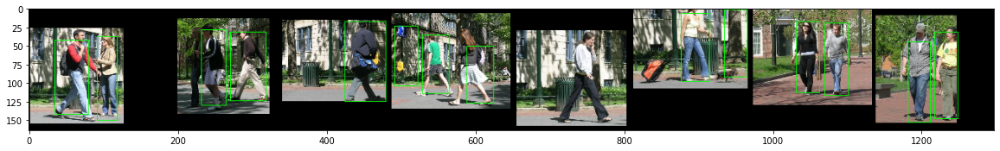

In [43]:
imgs, preds, res_grid = res[4]
res_grid = res_grid.permute([1, 2, 0])
plt.imshow(res_grid/255)
plt.show()

# Extend implementation to multiple ANCHORS (1 p.) and multiple output scales (1 p.)
It's ok if it's not completely general, but it has to be at more scales and/or using more anchors.

# Raport:

## Training:
Training on 400 epochs took about 1.5 hour on colab free. But due to debugging and experiments with multiple anchors I used all GPU limit multiple times, and barely managed to train a somehow decent model for a task.

I didn't achieve 55% on it though. Only about 28% on one anchor one layer. But in my opinion, the results from it are visually a little bit better than multi-anchor models. There are false negatives, but they are rarer than false positives in multi anchor models.

Models with more anchors or layers often gave quite a lot of false positives, or multiple boxes to one person. Best I achieved was about 40% at a peak.

I experimented a lot and I think I might have some bugs in a code because I couldn't achieve 55%. But overall visually I think my model performs not as bad


## Finding anchors

I found anchors by making histogram of boxes heights and widths and by trying to match anchor sizes to the biggest clusters of data